# Exploring Tox21 data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("/Users/siyeonim/Desktop/chemprop_data/tox21.csv")

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7831 entries, 0 to 7830
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   smiles         7831 non-null   object 
 1   NR-AR          7265 non-null   float64
 2   NR-AR-LBD      6758 non-null   float64
 3   NR-AhR         6549 non-null   float64
 4   NR-Aromatase   5821 non-null   float64
 5   NR-ER          6193 non-null   float64
 6   NR-ER-LBD      6955 non-null   float64
 7   NR-PPAR-gamma  6450 non-null   float64
 8   SR-ARE         5832 non-null   float64
 9   SR-ATAD5       7072 non-null   float64
 10  SR-HSE         6467 non-null   float64
 11  SR-MMP         5810 non-null   float64
 12  SR-p53         6774 non-null   float64
dtypes: float64(12), object(1)
memory usage: 795.5+ KB


In [5]:
len(df)

7831

In [4]:
df.head()

,smiles,NR-AR,NR-AR-LBD,NR-AhR,NR-Aromatase,NR-ER,NR-ER-LBD,NR-PPAR-gamma,SR-ARE,SR-ATAD5,SR-HSE,SR-MMP,SR-p53
0,CCOc1ccc2nc(S(N)(=O)=O)sc2c1,0.0,0.0,1.0,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,CCN1C(=O)NC(c2ccccc2)C1=O,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0
2,CC[C@]1(O)CC[C@H]2[C@@H]3CCC4=CCCC[C@@H]4[C@H]...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN
3,CCCN(CC)C(CC)C(=O)Nc1c(C)cccc1C,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0
4,CC(O)(P(=O)(O)O)P(=O)(O)O,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Here, we can see that each SMILES has 12 receptor datas to it. Later on, we will choose one of these 12 for the final data analysis. 
We also see lots of NaN, but we will leave them as they are, as it represents real life data which are frequently missing and messy. 

1 is a hit, 0 is a non-hit, and NaN are no data. 

# Cherry-picking data

## Cherry-pick smiles with charges

In [36]:
#if the smiles column has + and -, extract that entire row. 

multicharge_df= df[df['smiles'].str.contains("+" and "-")]
multicharge_df.head()

,smiles,NR-AR,NR-AR-LBD,NR-AhR,NR-Aromatase,NR-ER,NR-ER-LBD,NR-PPAR-gamma,SR-ARE,SR-ATAD5,SR-HSE,SR-MMP,SR-p53,mol,ring_systems
9,CCCCCCCC(=O)[O-].CCCCCCCC(=O)[O-].[Zn+2],NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f390>,[]
10,NC(=O)c1ccc[n+]([C@@H]2O[C@H](COP(=O)([O-])OP(...,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f3f0>,"[c1cc[nH+]cc1, C1CCOC1, C1CCOC1, c1ncc2nc[nH]c..."
15,O=C([O-])Cc1cccc2ccccc12,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f5d0>,[c1ccc2ccccc2c1]
34,c1ccc(-c2ccccc2)cc1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9fcf0>,"[c1ccccc1, c1ccccc1]"
45,CS(=O)(=O)NC(=O)c1cc(Oc2ccc(C(F)(F)F)cc2Cl)ccc...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36ba1150>,"[c1ccccc1, c1ccccc1]"


then convert this dataframe into a csv file

In [8]:

multicharge_df.to_csv(r'multicharged.csv')

in the cell below, we see that there is a total of 1163 rows/data. 
As we will see later on, this is the limiting number in our cherry-picked data, so after cherry-picking all the different sets of data, we will cut them all down to be 1163 points of data. 

In [9]:
len(multicharge_df)

1163

## Cherry-pick smiles with stereocenters

In [11]:
stereo_df= df[df['smiles'].str.contains("@")]
stereo_df.head()

,smiles,NR-AR,NR-AR-LBD,NR-AhR,NR-Aromatase,NR-ER,NR-ER-LBD,NR-PPAR-gamma,SR-ARE,SR-ATAD5,SR-HSE,SR-MMP,SR-p53
2,CC[C@]1(O)CC[C@H]2[C@@H]3CCC4=CCCC[C@@H]4[C@H]...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN
8,OC[C@H](O)[C@@H](O)[C@H](O)CO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0
10,NC(=O)c1ccc[n+]([C@@H]2O[C@H](COP(=O)([O-])OP(...,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,0.0
11,O=c1[nH]c(=O)n([C@H]2C[C@H](O)[C@@H](CO)O2)cc1I,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21,O=C(O)[C@H](O)c1ccccc1,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
len(stereo_df)

1322

as you can see, we have more than 1163 data points here. So we'll cut it down so that the total will be 1163. 

In [13]:
1322-1163

159

In [14]:
remove_n = 159
drop_indices = np.random.choice(stereo_df.index, remove_n, replace=False)
stereo_df = stereo_df.drop(drop_indices)

In [15]:
len(stereo_df)

1163

In [ ]:
stereo_df.to_csv(r'stero.csv')

## Cherry-pick smiles with rings

Here, 100% of the credit goes to that Pat Walter's blog. He wrote a nifty code to be able to identify ring systems in molecules. Please check out his post, as I have not shown the full potential of his code;

http://practicalcheminformatics.blogspot.com/2022/12/identifying-ring-systems-in-molecules.html

https://colab.research.google.com/github/PatWalters/practical_cheminformatics_tutorials/blob/main/misc/ChEMBL_ring_system_analysis.ipynb#scrollTo=8b4de6bc
 

In [16]:
# molecules with rings in them
   
!pip install useful_rdkit_utils mols2grid

import pandas as pd
from rdkit import Chem
import mols2grid
import useful_rdkit_utils as uru
from tqdm.auto import tqdm
from itertools import chain

In [17]:
tqdm.pandas()

In [18]:
df['mol'] = df.smiles.progress_apply(Chem.MolFromSmiles)

  0%|          | 0/7831 [00:00<?, ?it/s]

[21:54:31] WARNING: not removing hydrogen atom without neighbors


In [19]:
df.head()

,smiles,NR-AR,NR-AR-LBD,NR-AhR,NR-Aromatase,NR-ER,NR-ER-LBD,NR-PPAR-gamma,SR-ARE,SR-ATAD5,SR-HSE,SR-MMP,SR-p53,mol
0,CCOc1ccc2nc(S(N)(=O)=O)sc2c1,0.0,0.0,1.0,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b84f90>
1,CCN1C(=O)NC(c2ccccc2)C1=O,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b84d50>
2,CC[C@]1(O)CC[C@H]2[C@@H]3CCC4=CCCC[C@@H]4[C@H]...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f150>
3,CCCN(CC)C(CC)C(=O)Nc1c(C)cccc1C,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f1b0>
4,CC(O)(P(=O)(O)O)P(=O)(O)O,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f210>


In [20]:
ring_system_finder = uru.RingSystemFinder()

In [21]:
df['ring_systems'] = df.mol.progress_apply(ring_system_finder.find_ring_systems)

  0%|          | 0/7831 [00:00<?, ?it/s]

In [22]:
df.head()

,smiles,NR-AR,NR-AR-LBD,NR-AhR,NR-Aromatase,NR-ER,NR-ER-LBD,NR-PPAR-gamma,SR-ARE,SR-ATAD5,SR-HSE,SR-MMP,SR-p53,mol,ring_systems
0,CCOc1ccc2nc(S(N)(=O)=O)sc2c1,0.0,0.0,1.0,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b84f90>,[c1ccc2scnc2c1]
1,CCN1C(=O)NC(c2ccccc2)C1=O,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b84d50>,"[O=C1CNC(=O)N1, c1ccccc1]"
2,CC[C@]1(O)CC[C@H]2[C@@H]3CCC4=CCCC[C@@H]4[C@H]...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f150>,[C1=C2CC[C@H]3[C@@H]4CCC[C@H]4CC[C@@H]3[C@H]2C...
3,CCCN(CC)C(CC)C(=O)Nc1c(C)cccc1C,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f1b0>,[c1ccccc1]
4,CC(O)(P(=O)(O)O)P(=O)(O)O,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f210>,[]


in the 'ring_systems' column, we see that some of them are an empty list (like so; []). So we're going to only select the ones where there actually is a ring system by picking out the ones where there is something written in between the [ and ]. 

In [23]:

rings_df = df[(df["ring_systems"].str.len()) >1]

rings_df.head()

,smiles,NR-AR,NR-AR-LBD,NR-AhR,NR-Aromatase,NR-ER,NR-ER-LBD,NR-PPAR-gamma,SR-ARE,SR-ATAD5,SR-HSE,SR-MMP,SR-p53,mol,ring_systems
1,CCN1C(=O)NC(c2ccccc2)C1=O,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b84d50>,"[O=C1CNC(=O)N1, c1ccccc1]"
7,O=C(O)Cc1cc(I)c(Oc2ccc(O)c(I)c2)c(I)c1,0.0,NaN,0.0,NaN,1.0,NaN,NaN,1.0,0.0,1.0,0.0,1.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f2d0>,"[c1ccccc1, c1ccccc1]"
10,NC(=O)c1ccc[n+]([C@@H]2O[C@H](COP(=O)([O-])OP(...,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,NaN,NaN,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f3f0>,"[c1cc[nH+]cc1, C1CCOC1, C1CCOC1, c1ncc2nc[nH]c..."
11,O=c1[nH]c(=O)n([C@H]2C[C@H](O)[C@@H](CO)O2)cc1I,0.0,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f450>,"[O=c1cc[nH]c(=O)[nH]1, C1CCOC1]"
22,Nc1ccc(/N=N/c2ccccc2)cc1,0.0,0.0,1.0,NaN,1.0,0.0,NaN,1.0,1.0,0.0,NaN,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36b9f870>,"[c1ccccc1, c1ccccc1]"


In [24]:
len(rings_df)

2658

Again, this data point is over our lowest common denominator, 1163. So let's cut it down to 1163 data points. 

In [25]:
2658-1163

1495

In [26]:
remove_n = 1495
drop_indices = np.random.choice(rings_df.index, remove_n, replace=False)
rings_df = rings_df.drop(drop_indices)

In [27]:
len(rings_df)

1163

In [ ]:
rings_df.to_csv(r'rings.csv')

## Cherry-pick 1163 random smiles

Now I will randomly select 1163 data points. This will serve as our 'negative control'. The chosen smiles will not be as skewed (in terms of chemical space) as the ones I've cherry-picked above. 

In [28]:
random_df = df.sample(n=1163, random_state = 42)
random_df.head()

,smiles,NR-AR,NR-AR-LBD,NR-AhR,NR-Aromatase,NR-ER,NR-ER-LBD,NR-PPAR-gamma,SR-ARE,SR-ATAD5,SR-HSE,SR-MMP,SR-p53,mol,ring_systems
1142,NCC(=O)O,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN,NaN,<rdkit.Chem.rdchem.Mol object at 0x7ffd36bbc3f0>,[]
4567,C=CC(=O)OCCCCCCCC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36c0ec30>,[]
2592,CC(C)=CCCC(C)CCO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36bdfc30>,[]
1677,C/C(=C(\CCOC(=O)c1ccccc1)SS/C(CCOC(=O)c1ccccc1...,0.0,0.0,0.0,0.0,NaN,0.0,0.0,NaN,0.0,NaN,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36bc8f30>,"[c1ccccc1, c1ccccc1, c1cncnc1, c1cncnc1]"
4958,O=C1CCCCC1CN1CCCCC1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,NaN,0.0,0.0,<rdkit.Chem.rdchem.Mol object at 0x7ffd36c18150>,"[O=C1CCCCC1, C1CCNCC1]"


In [ ]:
random_df.to_csv(r'random.csv')

# Chemplot

In [20]:
import matplotlib.pyplot as plt
from pandas import read_csv
from chemplot import Plotter
import matplotlib.image as mpimg
from matplotlib import rcParams

## chemical space of the cherry-picked Tox21 data

For the input file, I concatenated all the cherry-picked data and replaced the 1s and 0s with the corresponding dataset name. This is what the input file looked like;

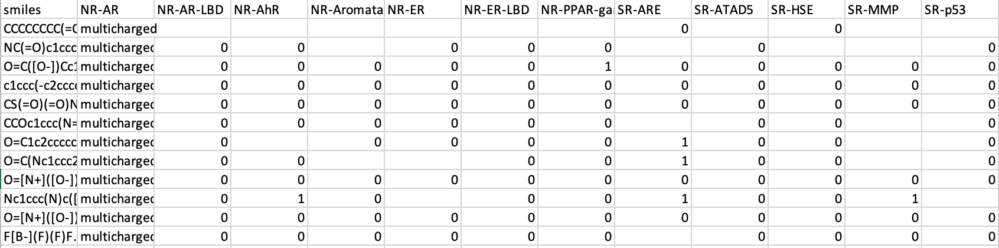

In [5]:
full_data = read_csv("/Users/siyeonim/Desktop/chemprop_data/parsed_data/all_combined_for_chemical_space.csv")

In [6]:
full_data['NR-AR'].isna().sum()

0

In [7]:
full_cp = Plotter.from_smiles(full_data["smiles"], target=full_data["NR-AR"], target_type="C")

sim_type indicates the similarity type by which the plots are constructed.
The supported similarity types are structural and tailored.
Because a target list has been provided 'tailored' as been selected as sym_type.


[14:43:46] WARNING: not removing hydrogen atom without neighbors
[14:43:46] WARNING: not removing hydrogen atom without neighbors
[14:43:46] WARNING: not removing hydrogen atom without neighbors
[14:43:46] WARNING: not removing hydrogen atom without neighbors


For the following SMILES not all descriptors can be computed:
O=[N+]([O-])[O-].O=[N+]([O-])[O-].[Ca+2]
F[B-](F)(F)F.[H+]
[I-].[K+]
O.O.O.O.O.O.O=[N+]([O-])[O-].O=[N+]([O-])[O-].[Mg+2]
O=[Cr](=O)([O-])O[Cr](=O)(=O)[O-]
O=S(=O)([O-])[O-].[Na+].[Na+]
[O-][Cl+3]([O-])([O-])[O-]
CNC(=O)CN(CCN(CCN(CC(=O)[O-])CC(=O)NC)CC(=O)[O-])CC(=O)[O-].[Gd+3]
N#C[S-]
O=S(=O)([O-])[O-].[Li+].[Li+]
[C-]#N.[Cu+]
O=[Se]([O-])[O-]
O=[N+]([O-])[O-].[Na+]
O=N[O-]
O=S(=O)([O-])SSS(=O)(=O)[O-]
CC(O)CN1CCN(CC(=O)[O-])CCN(CC(=O)[O-])CCN(CC(=O)[O-])CC1.[Gd+3]
F[B-](F)(F)F
O=S(=O)([O-])[S-]
O=C([O-])CC(S[Au])C(=O)[O-]
[N-]=[N+]=[N-]
O=S(=O)([O-])O.[Na+]
N#C[N-]C#N
O=[N+]([O-])[O-].[NH4+]
O=P([O-])([O-])OP(=O)([O-])[O-]
O=S(=O)([O-])OOS(=O)(=O)[O-]
O=[N+]([O-])[O-].[K+]
O=P([O-])(O)OP(=O)([O-])O
[Br-].[Na+]
[Ca+2].[Cl-].[Cl-]
O=[N+]([O-])O[Cd]O[N+](=O)[O-]
NS(=O)(=O)[O-]
N#C[Au-]C#N
N#C[Fe-2](C#N)(C#N)(C#N)(C#N)N=O
O=[Se](O)O
NS(=O)(=O)[O-]
[Cu+2]
[Ni+2]
[I-].[K+]
S=C=S
[As]#[In]
Br[Ca]Br
O=C1O[Pt]2(N[C@@H]3CCCC[C@H]3N

<AxesSubplot:label='scatter', title={'center':'t-SNE plot'}, xlabel='t-SNE-1', ylabel='t-SNE-2'>

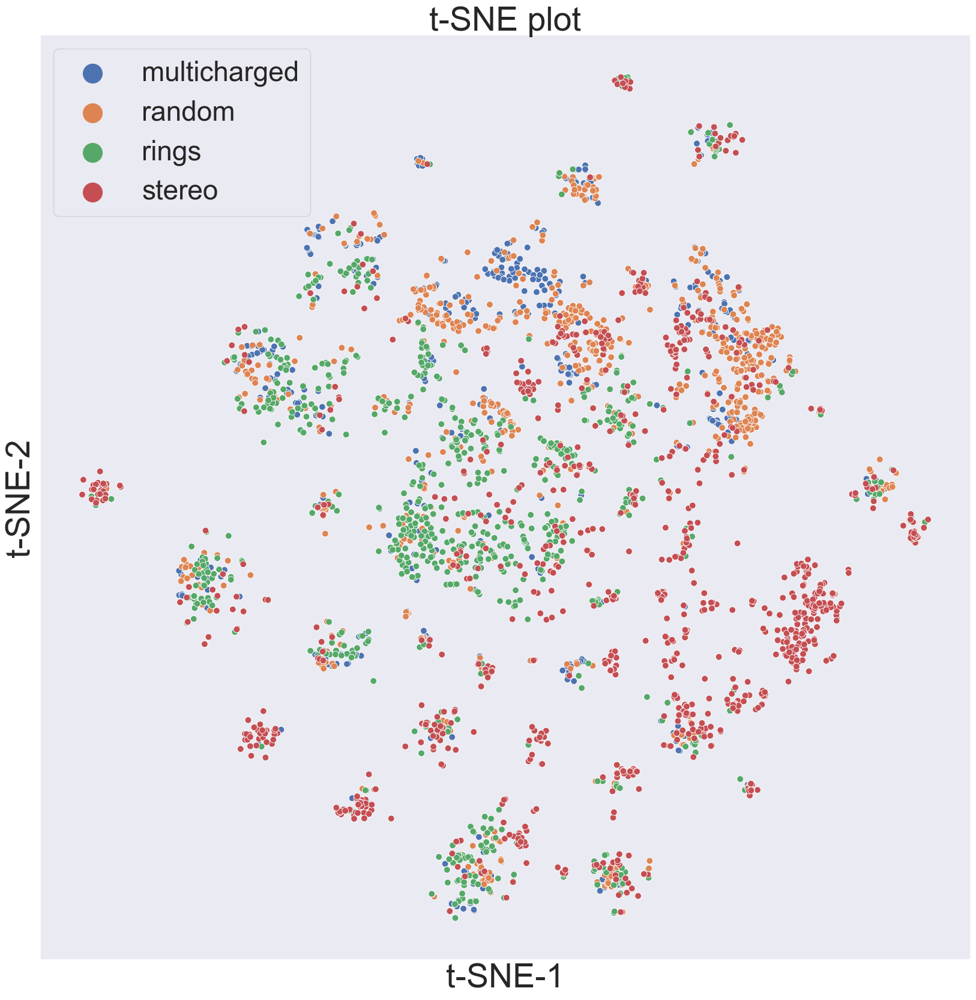

In [8]:
full_cp.tsne()
full_cp.visualize_plot()

<AxesSubplot:label='scatter', title={'center':'PCA plot'}, xlabel='PC-1 (12%)', ylabel='PC-2 (7%)'>

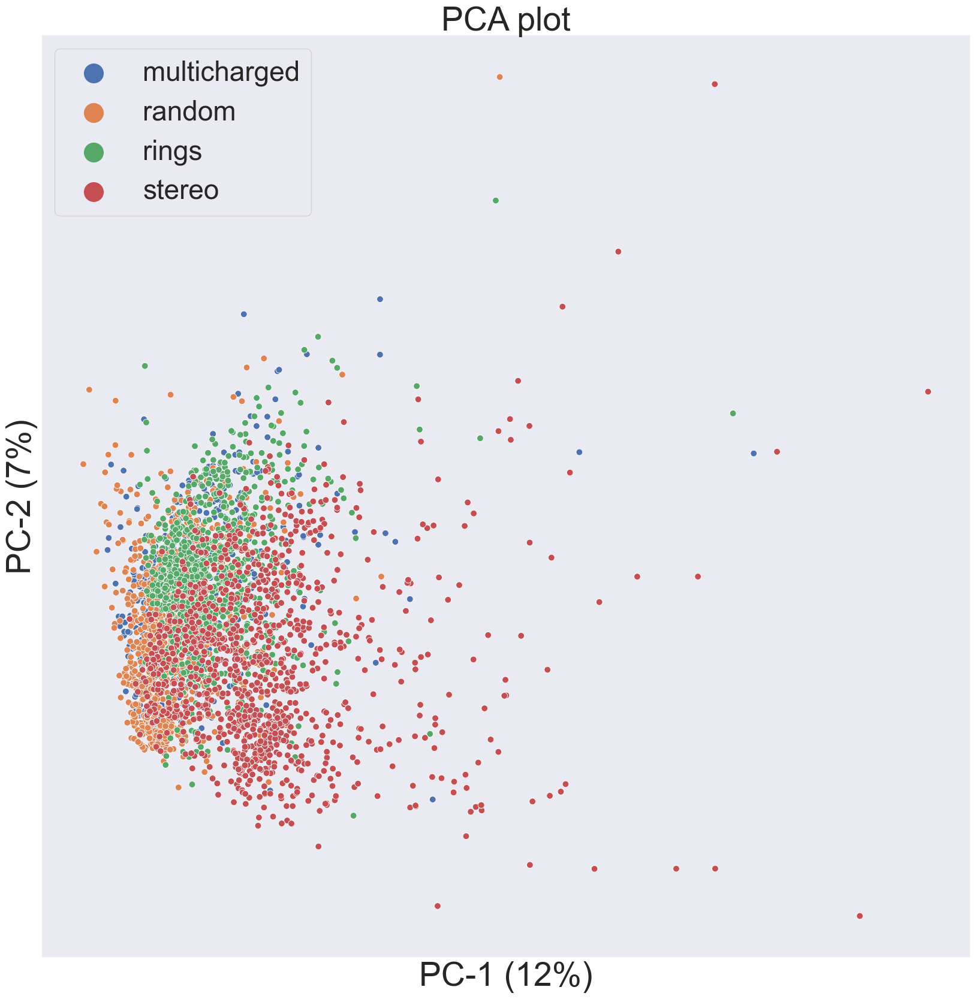

In [9]:
full_cp.pca()
full_cp.visualize_plot()

/Users/siyeonim/opt/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


<AxesSubplot:label='scatter', title={'center':'UMAP plot'}, xlabel='UMAP-1', ylabel='UMAP-2'>

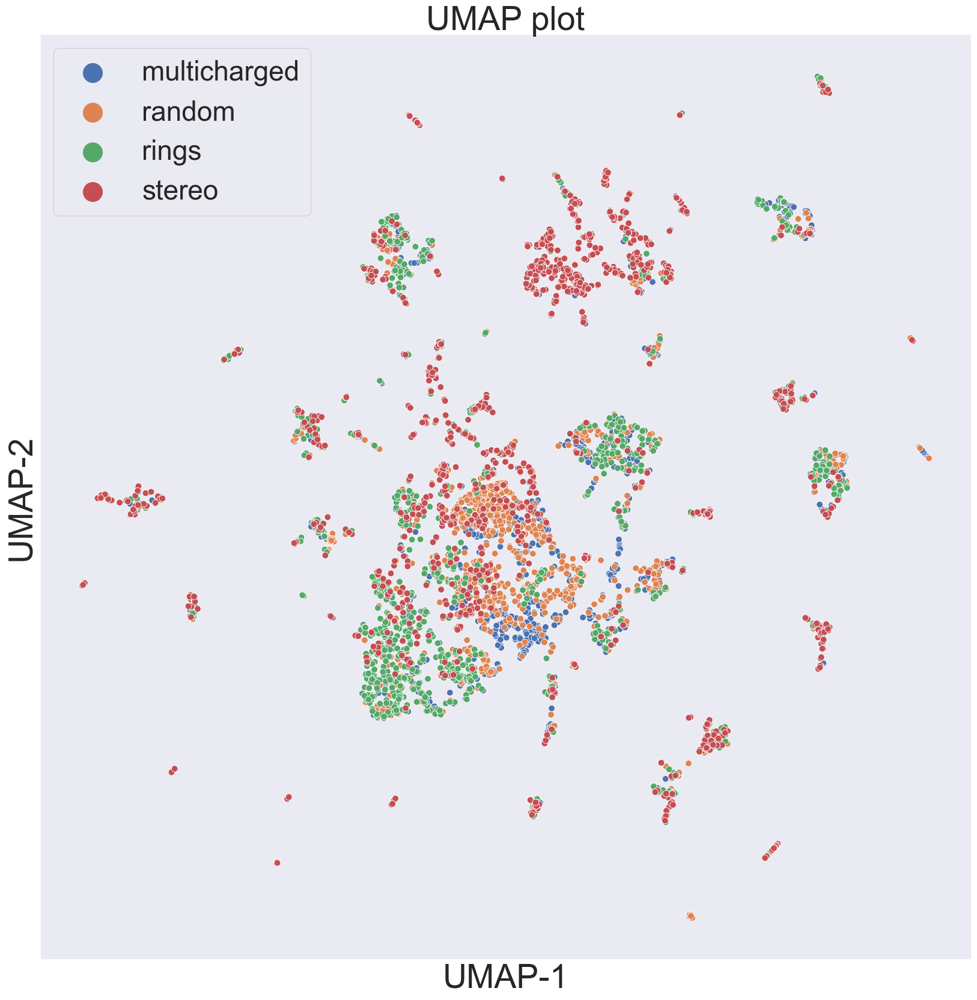

In [10]:
full_cp.umap()
full_cp.visualize_plot()

## chemical space of the entire Tox21 set (not cherry-picked)

For the input file, I replaced the 1s and 0s with 'all of tox21'. This is what the input file looked like;

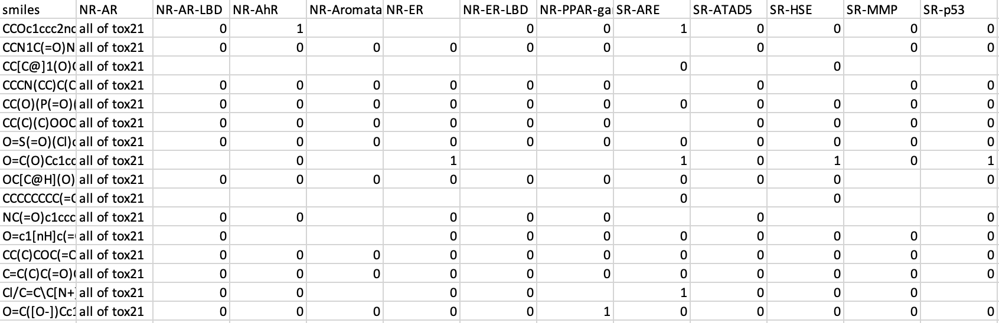

In [13]:
tox21_data = read_csv("/Users/siyeonim/Desktop/chemprop_data/parsed_data/tox21_chemical_space.csv")

In [14]:
tox21_data['NR-AR'].isna().sum()

0

In [15]:
tox21_cp = Plotter.from_smiles(tox21_data["smiles"], target=tox21_data["NR-AR"], target_type="C")

sim_type indicates the similarity type by which the plots are constructed.
The supported similarity types are structural and tailored.
Because a target list has been provided 'tailored' as been selected as sym_type.
Only one class found in the targets


[14:48:23] WARNING: not removing hydrogen atom without neighbors


No handles with labels found to put in legend.


<AxesSubplot:label='scatter', title={'center':'t-SNE plot'}, xlabel='t-SNE-1', ylabel='t-SNE-2'>

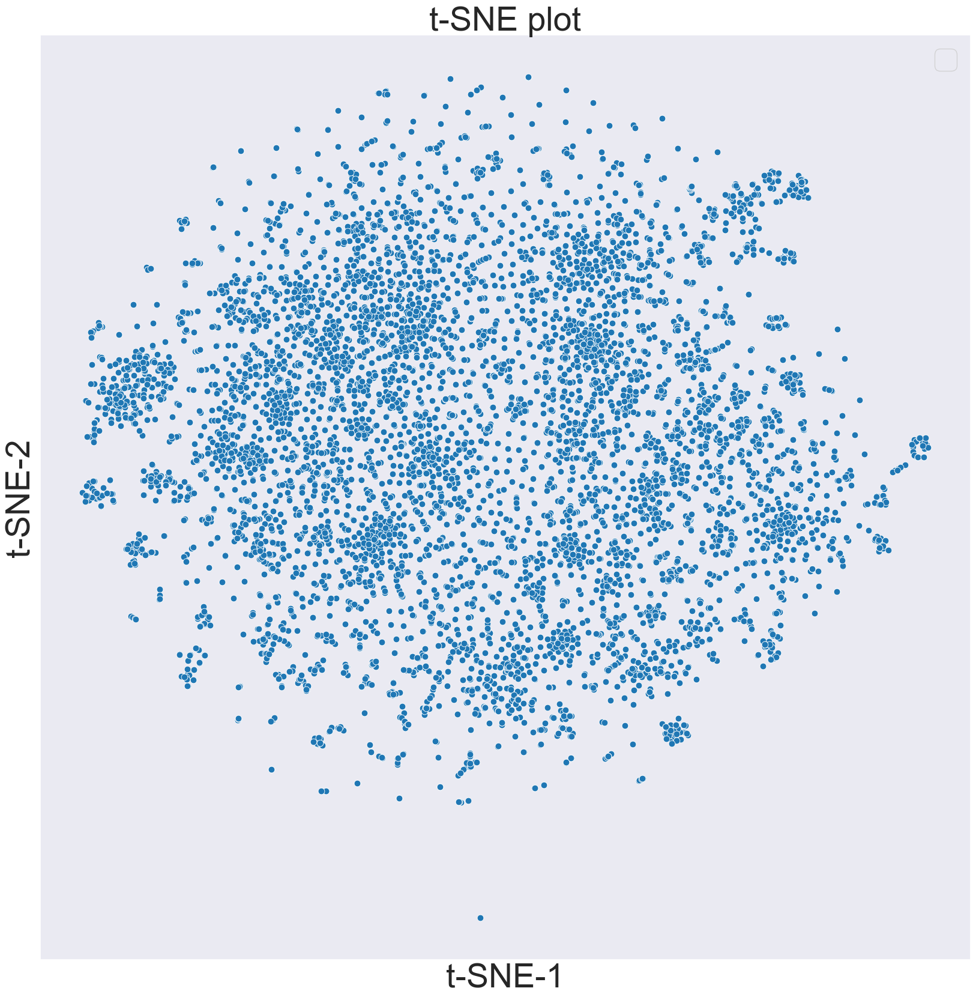

In [16]:
tox21_cp.tsne()
tox21_cp.visualize_plot()

No handles with labels found to put in legend.


<AxesSubplot:label='scatter', title={'center':'PCA plot'}, xlabel='PC-1 (4%)', ylabel='PC-2 (4%)'>

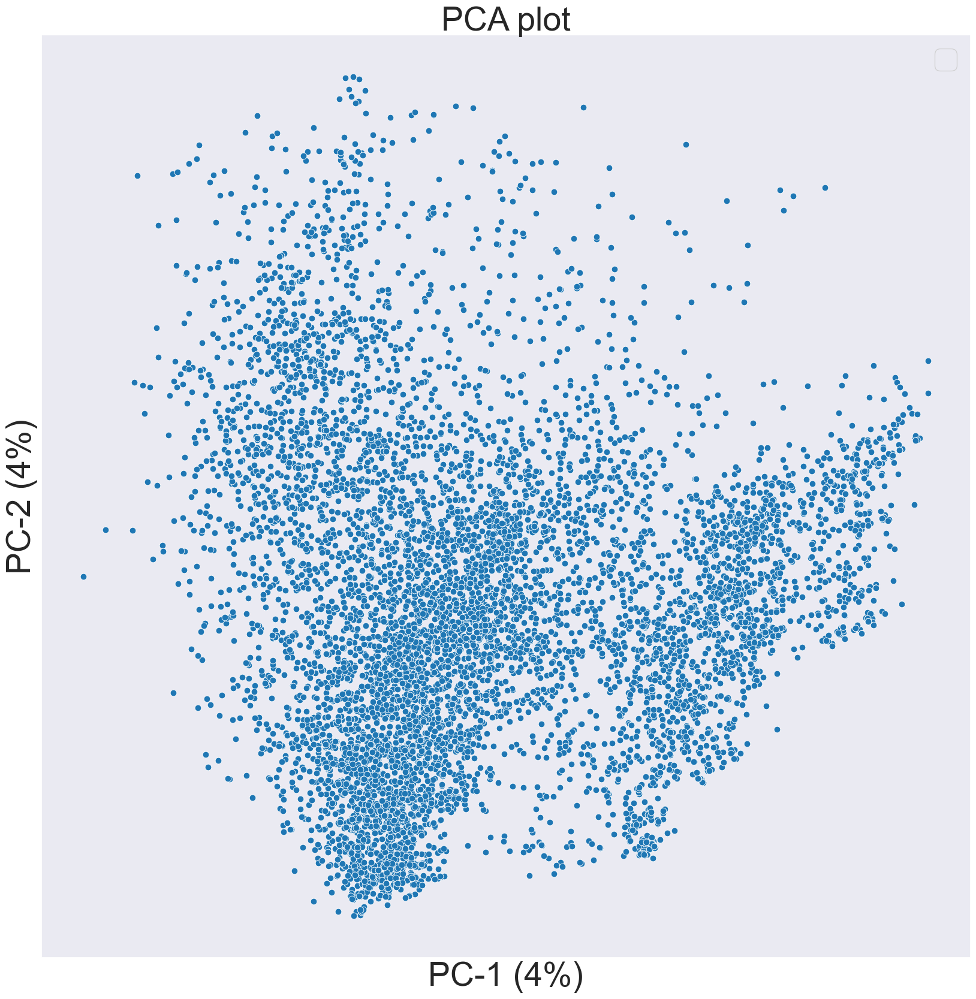

In [17]:
tox21_cp.pca()
tox21_cp.visualize_plot()

No handles with labels found to put in legend.


<AxesSubplot:label='scatter', title={'center':'UMAP plot'}, xlabel='UMAP-1', ylabel='UMAP-2'>

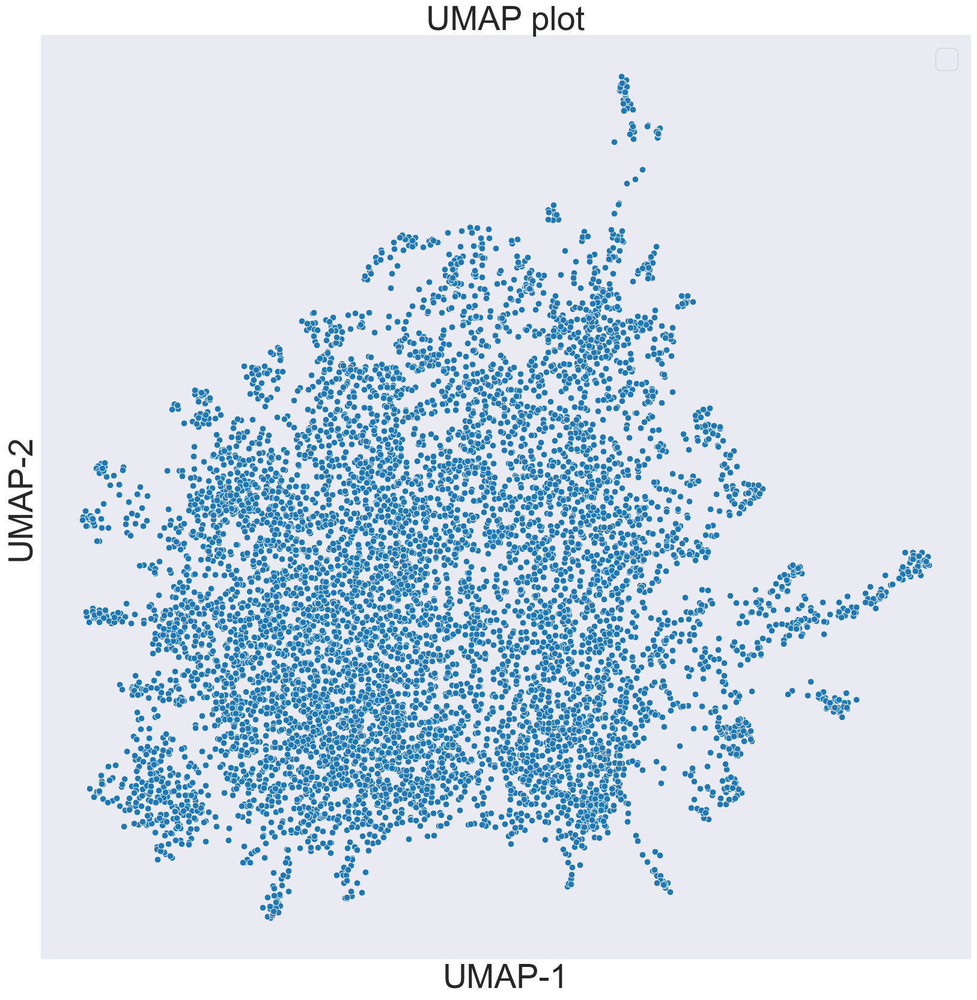

In [18]:
tox21_cp.umap()
tox21_cp.visualize_plot()

combine all the plots so we can see them all at once

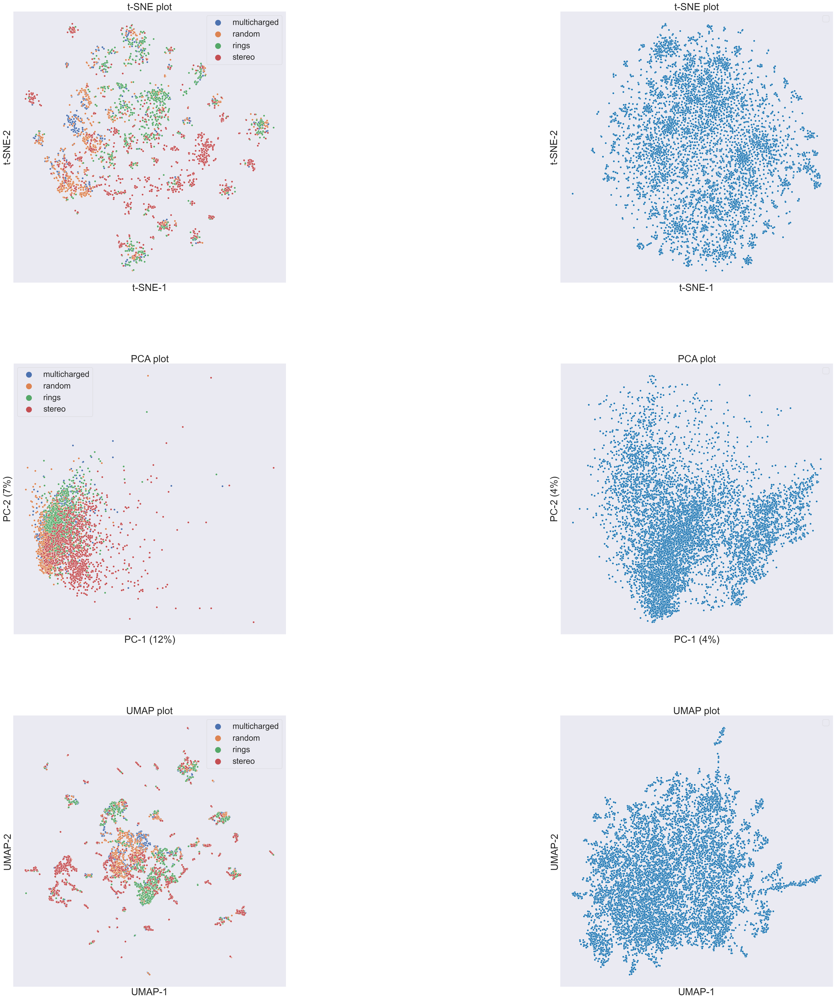

In [25]:

%matplotlib inline

# figure size in inches optional
rcParams['figure.figsize'] = 100,100

# read images
img_A = mpimg.imread('/Users/siyeonim/Desktop/chemprop_chemplot/tSNE_plots/full.png')
img_B = mpimg.imread('/Users/siyeonim/Desktop/chemprop_chemplot/PCA_plots/full.png')
img_C = mpimg.imread('/Users/siyeonim/Desktop/chemprop_chemplot/UMAP_plots/full.png')

img_D = mpimg.imread('/Users/siyeonim/Desktop/chemprop_chemplot/tSNE_plots/tox21.png')
img_E = mpimg.imread('/Users/siyeonim/Desktop/chemprop_chemplot/PCA_plots/tox21.png')
img_F = mpimg.imread('/Users/siyeonim/Desktop/chemprop_chemplot/UMAP_plots/tox21.png')

# display images
fig, ax = plt.subplots(3,2)
ax[0,0].imshow(img_A)
ax[1,0].imshow(img_B)
ax[2,0].imshow(img_C)

ax[0,1].imshow(img_D)
ax[1,1].imshow(img_E)
ax[2,1].imshow(img_F)

ax[0,0].axes.get_xaxis().set_visible(False)
ax[1,0].axes.get_xaxis().set_visible(False)
ax[2,0].axes.get_xaxis().set_visible(False)

ax[0,1].axes.get_xaxis().set_visible(False)
ax[1,1].axes.get_xaxis().set_visible(False)
ax[2,1].axes.get_xaxis().set_visible(False)

ax[0,0].axes.get_yaxis().set_visible(False)
ax[1,0].axes.get_yaxis().set_visible(False)
ax[2,0].axes.get_yaxis().set_visible(False)

ax[0,1].axes.get_yaxis().set_visible(False)
ax[1,1].axes.get_yaxis().set_visible(False)
ax[2,1].axes.get_yaxis().set_visible(False)
